# OpAmp Applicazioni: Circuito giratore

**Informazioni generali.** Costruire un elemento induttivo con gli OpAmp


##Verifica comportamento circuito come un impedenza

##Simulazione con Tina
Abbiamo simulato il cirucito in figura con Z resistenza reale, ottenendo un grafico con un comportamento simile ad un filtro passa alto.

Immaginando di voler corstruire un induttore da 100mH , utilizzando la formula di Wheeler $L = \frac{N^2 \mu A}{l}$ e considerando 500 spire con un diametro di 20cm, si ottiene una induttore di lunghezza 10cm
con $R = \rho\frac{l}{s}$ , con $R\sim180\Omega$

 
##Circuito

abbiamo montato il circuito in figura, con i seguenti valori di r1 r2 e Z resietenza reale, creando un filtro passa alto

$R1 = 100.18k\Omega$
 R2 = 99.90Ohm
Z = 678.6Ohm = 329.89=Ohm
C = 10.51nF
due C in serie = 110.0nF


impostiamo una frequenza di taglio a fc = 500Hz, quindi z = R = 330Ohm

ringraziamo carlo, il tizio che si occupava del........ com e che si chiama, dell officina Omar, prendevo un sacco di roba da quell officina!

abbimao ripetuto el prese dati con diversi OpAmp, nell ordine OP77, AD8031, LM741 per il meme


$\omega_0 =\frac{1}{\sqrt{LC}}$ 





onda quadra nel tempo




Poi abbiamo sostituito la resistenza R = 330Ohm, con due condensatori in serie da C = 50nf ciascuno, misurando una capacita Ceq = 110.0nF
nel dominio delle frequenze ci asptettiamo di trovare una risonanza, 


#Approfondimento finale SLAYY

modificare circuito in modo da ottenere un fattore di qualità massimo, con $Q = \frac{\omega_0}{\gamma}$ , con $\omega_0$ frequenza di risonanza e $\gamma$ coefficiente del termine dissipativo nel circuito RLC, 


con vari calcoli decidiami di raddoppiare Q, raddoppiando L e dimezzando C
L = r1 * r2 * Cg CG condensatore giratore, 
R2 = 220.99 k Ohm
C = 55.51 nF




proviamo a quadruplicare

C = 22.51 nF
due R2 in serie quella sopra e 221.72kOhm

abbiamo cambiato l ampiezza del segnale d ingresso perché non si vedeva un picco maggiore rispetto al caso precedente e temevano potesse essere un problema di saturazione

ora il segnale in entrata è' di 0.1v, prima di 2V




Giovedi
si sono rimontati il circuito con il fattore di qualità 4 dell altra volta e metto in serie alla parte induttiva del circuiti un condensatore per creare un filtro blocca banda, la capacità del condensatore è di C = 55.44nF

simulazione con tina, con i valori 







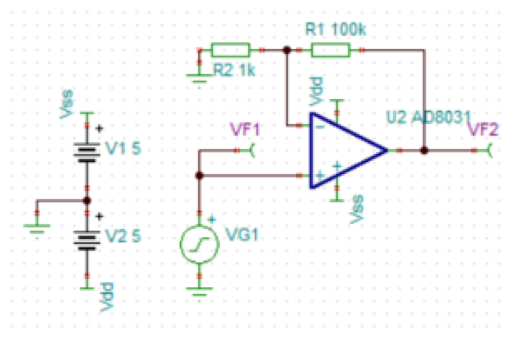

In [62]:
import fitz  # PyMuPDF
from PIL import Image
import matplotlib.pyplot as plt

# Function to convert a PDF page to an image
def pdf_page_to_image(pdf_path, page_num=0):
    pdf_document = fitz.open(pdf_path)
    page = pdf_document.load_page(page_num)  # Load the specified page
    pix = page.get_pixmap()  # Convert page to image
    img = Image.frombytes("RGB", [pix.width, pix.height], pix.samples)
    return img

# Function to display two PDF pages side by side
def display_pdfs_side_by_side(rows, cols, pdfList):
    # Convert all PDF pages to images
    imgList = []
    for pdf in pdfList:
        imgList.append(pdf_page_to_image(pdf))

    # Create a new figure for nxm subplots (n row, m columns)
    if cols == 1 and rows == 1:
        #img = pdf_page_to_image(pdf_path)
        plt.imshow(imgList[0])
        plt.axis('off')
        plt.show()
        return
    
    fig, axes = plt.subplots(rows, cols, figsize=(65, 40), squeeze=False)
    
    # Display the various images

    for i in range(rows):
        print(i)
        if cols == 1:
            axes[i].imshow(imgList[i])
            axes[i].axis('off')
        else:
            for j in range(cols):
                axes[i][j].imshow(imgList[i*cols+j])
                axes[i][j].axis('off')
    plt.show()



# Provide the paths to your two PDFs
pdfList = ['Media/OpAMP_2_AD8031.png' ]
rows = 1
cols = 1
display_pdfs_side_by_side(rows, cols, pdfList)


0


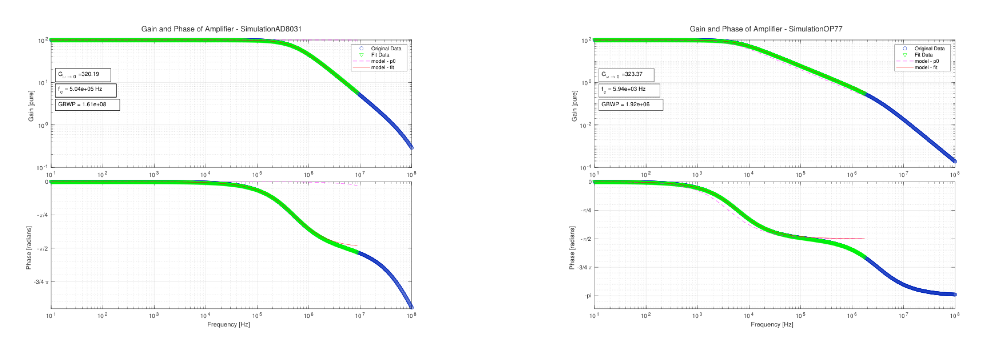

In [63]:
pdfList = ['Media/bodePlotAndFit-SimulationAD8031.pdf','Media/bodePlotAndFit-SimulationOP77.pdf' ]
rows = 1
cols = 2
display_pdfs_side_by_side(rows, cols, pdfList)

I dati acquisiti durante la simulazione sono quelli in blu, per il fit si sono usati solo quelli in verde, perché oltre frequenze di $10^7 Hz$ l AD8031 non rispecchia piu il modello che siamo interessati a studiare, per l OP77 si è tagliato a $10^6Hz$.


Qui e in seguito gli errori son stati ottenuti tramite varie misure in punti diversi e calcolando media e varianza di queste misure. Si è poi assunto che la varianza fosse la stessa tra tutte le misure come è su una singola misura.

Si sono poi stimate la frequenza di taglio $f_c $, il Guadagno $G = \frac{G(0)}{1 + j\omega\tau_c}$ e il prodotto $G(0)f_c = GBWP$ con un fit, ottenendo i valori riportati nei grafici.

In entrambe le simulazioni il guadagno a basse frequenze è compatible con il guadagno $G\sim100$ per cui sono stati corstruiti i circuiti.



### Verifica sperimentale 
Si è costruito un circuito con guadagno $G\sim 100$ per l OP77 con $R1 = 1k\Omega$ e $R2 = 100k\Omega$ e si è mandata in ingresso una sinusoide da $1kHz$ per regolare l’ampiezza e l eventuale offset in maniera da non saturare l’uscita dell’amplificatore. 

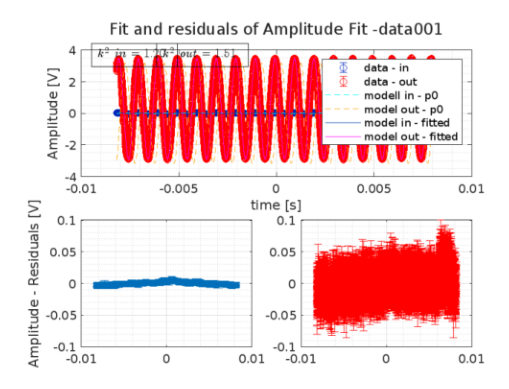

In [64]:
pdfList = ['Media/seno_check.png']
rows = 1
cols = 1
display_pdfs_side_by_side(rows, cols, pdfList)

La sinusoide non presenta distorsioni e l offset è compatibile con $0 V$, per quanto riguarda l ampiezza del segnale in uscita abbiamo implementato nel circuito un patritore di tensione per regolarla in maniera da non saturare l’uscita dell’amplificatore, mettendo in serie una resistenza da 1.4Kohm e 3.3KOhm, riducendo l ingresso di un fattore 1/3. Mandando in ingresso un segnale da 0.1mV e aspettandosi un guadagno di circa 100, si ottiene un output di circa 3V, che non satura l uscita dell amplificatore.

Lo stesso ragionamento è stato ripetuto per $G\sim300$ e $G\sim1000$, utilizzando $R2 = 329.02\pm0.9\Omega$ $R2 = 0.9972\pm0.001M\Omega$, con partitore da $14.990\pm 0.05k\Omega$ e $221.07k\pm0.66k\Omega$ rispettivamente.

Gli errori dei valori riportati in tabella sono gia scritti sopra.

| Guadagno| R1 $[k\Omega]$ | R2 $[k\Omega]$ | Partitore $[k\Omega]$|
| :-: | :-:| :-: |:-: |
| $ 100 $ | $0.997\pm0.023 $ | $100.2 $ | $4.77$ |
| $ 300 $ | $0.997\pm0.023 $ | $329.02$ | $14.990$ |
| $ 1000 $ | $0.997\pm0.023$ | $997.2$ | $221.07$ |


Il diagramma di Bode è stato acquisito utilizzando sweepfreq.ipynb nel range di frequenze $ 10^0 Hz - 10^6 Hz $ modifilando opportunamente la funzione di fit per includere un eventuale parametro di offset.



0
1


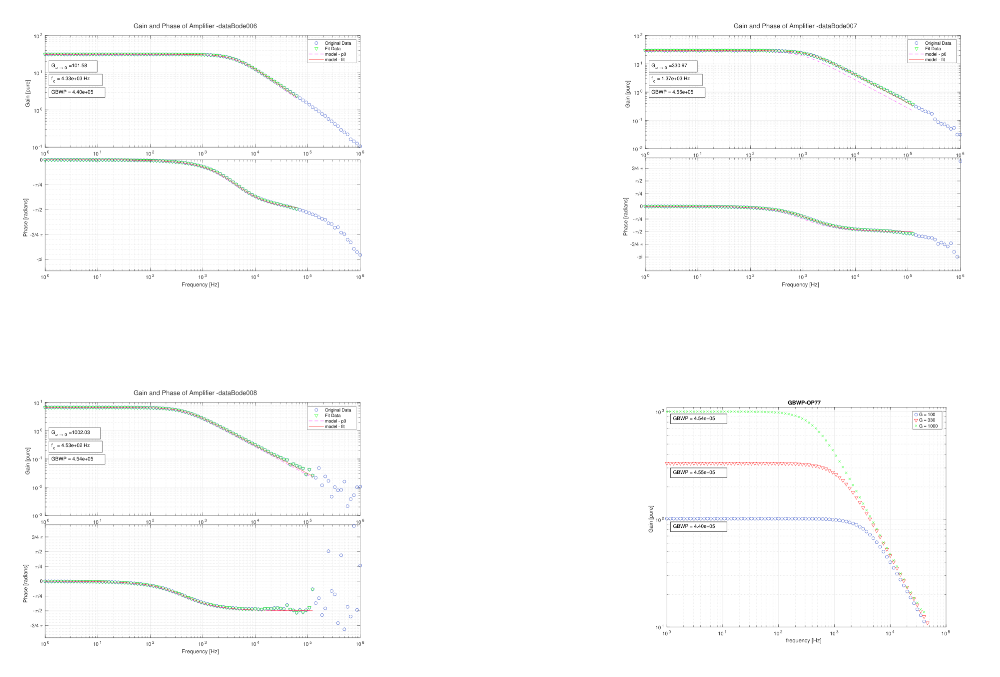

In [65]:
pdfList = ['Media/bodePlotAndFit-dataBode006.pdf', 'Media/bodePlotAndFit-dataBode007.pdf' , 'Media/bodePlotAndFit-dataBode008.pdf' , 'Media/GBWP-OP77.pdf']
rows = 2
cols = 2
display_pdfs_side_by_side(rows, cols, pdfList)

Dai grafici,  si può notare come il modello di fit e i dati acquisiti si sovrappogano quasi totalment eper frequenze inferiori a $10^5$, è ragionevole quindi assumere che il modello sia buono per i dati nel range di frequenze opportuno.
 
 

 Comparando il valore del GBWP tra i vari circuiti a guadagni diversi, visibile nel grafico sopra, si può notare che il prodotto rimane costante, come ci si aspetterebbe dalla teoria, entro 3 barre d errore, considerando che l incertezza sui singoli GBWP è di $0.05 10^5 $ e la massima differenza tra due GBWP di due guadagni diversi è $0.14 10^5$.
 Discorso analogo vale per l OP77 riportato sotto.
  Confrontando il valore di GBWP del fit con quello della simulazione non si ha un perfetto riscontro, probabilmente per effetti di ordini superiori simulati in maniera diversa da come appaiano nella realtà, come si nota dal fatto che i grafici di Tina contengano due gomiti contro il singolo gomito presente in quelli di presa dati, e anche dalle completamente diverse frequenze di taglio tra realtà e Tina.








Si sono prese le stesse misure con l AD8031, ma arrivando fino a frequenze sui $10^7 Hz $ e si possono osservare gli stessi effetti con aggiunta di rumore ad alti guadagni e alte frequenze di natura diversa da quello ottenuto on OP77, seppure problematico allo stesso modo.

0
1


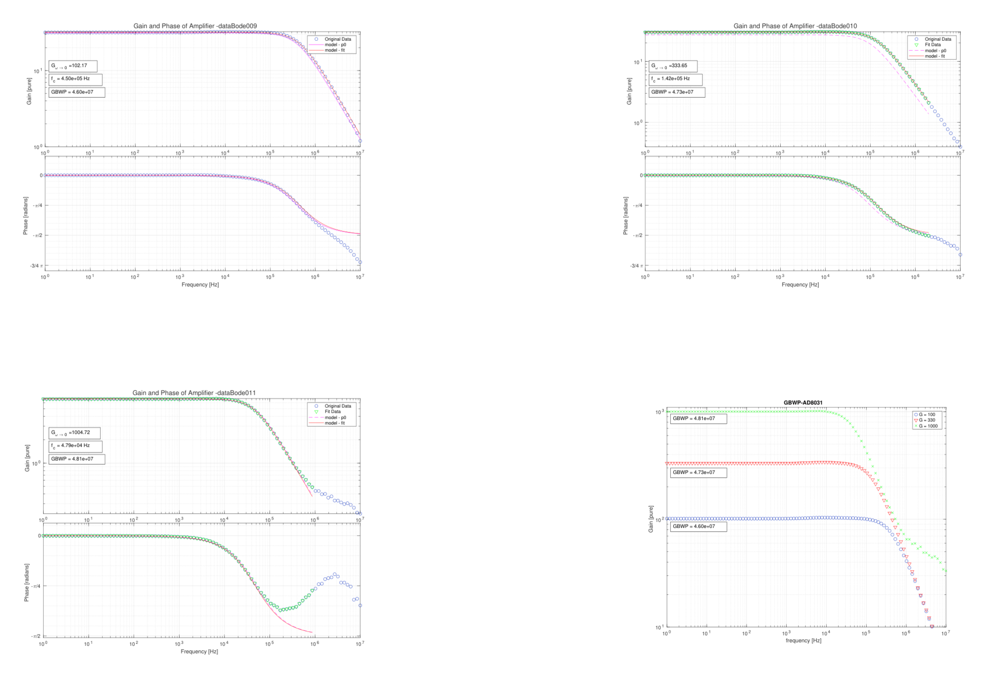

In [66]:
pdfList = ['Media/bodePlotAndFit-dataBode009.pdf', 'Media/bodePlotAndFit-dataBode010.pdf' , 'Media/bodePlotAndFit-dataBode011.pdf' , 'Media/GBWP-AD8031.pdf']
rows = 2
cols = 2
display_pdfs_side_by_side(rows, cols, pdfList)



##  Circuiti con retroazione positiva

### Trigger di Schmitt


Con OpAmp si possono realizzare anche circuiti a retroazione positiva i quali tuttavia, essendo come ben noto impossibile avere guadagni esponenziali, satureranno.

Uno di questi circuiti è il Trigger di Schmitt, di cui uno schema è riportato di seguito, circuito bistabile con isteresi in grado di rendere l'uscita di un sistema digitale ma anche impervia a rumore, in quanto soglie minima e massima per variare di stato non sono coincidenti.

Per dimostrare il funzionamento di uno di questi circuiti si è deciso di mostrare la risposta a una sinusoide di ampiezza tale da eccitare il circuito e causare switch continui tra uno stato e il successivo e anche come, stimulando il circuito con ampiezze minori del valore assoluto delle tensioni di soglia, si può ottenere un circuito che mantenga l'uscita stabile senza effetti dall'ingresso.

0


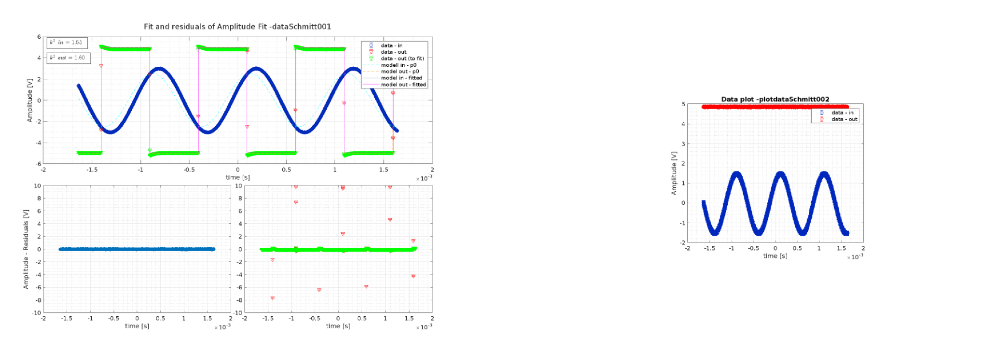

In [67]:
cols = 2
rows = 1
pdfList = ['Media/plotdataSchmitt001.pdf', 'Media/plotdataSchmitt002.pdf']
display_pdfs_side_by_side(rows, cols, pdfList)

Si sono usate $R1 = 996.0\Omega \sim R2 = 993.1 \Omega \sim 1k\Omega$ e un onda sinusoidale in ingresso. 
Dal grafico si può vedere che il circuito si comporta come previsto dalla teoria, mostrando una natura bistabile.

## Multivibratore astabile



Per il circuito si sono usati $R3 = 3.282\pm.0.004k\Omega$ e $1.4901\pm0.002k\Omega$ e $C = 215.6\pm6.2nF$



0


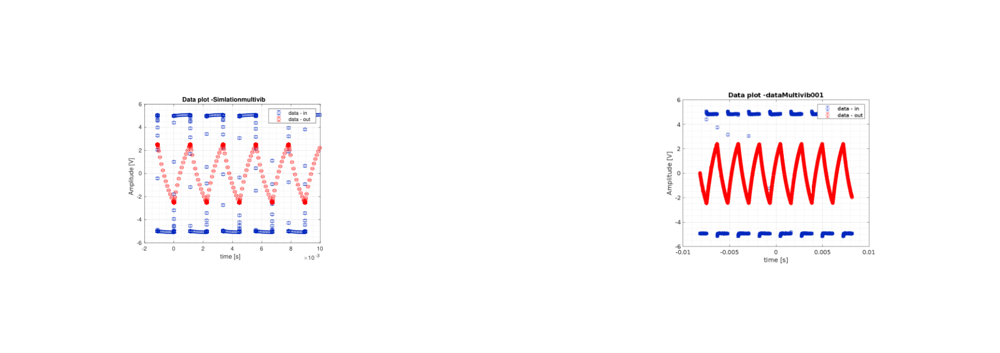

In [68]:
cols = 2
rows = 1
pdfList = ['Media/Simlationmultivib.pdf', 'Media/plotdataMultivib001.pdf']
display_pdfs_side_by_side(rows, cols, pdfList)

Analizzando il circuito come un trigger di Schmitt con una sezione in aggiunta si può osservare un cambio di stato quando la tenzione $V_+$ ai capi del condensatore scende sotto la soglia $V_+ = \frac{R1}{R1+R2}$ , considerando $V_c$ come la tensione di carica di un condensatore si può scrivere nella forma $V_C = A(1-e^{-\frac{t}{\tau}})$  con Ampiezza pari a 7.5V ( $V_- = -2.5V$ e $V_s = 5V$)  ottenendo una frequenza pari a $f = \frac{1}{2.15\tau}$ , quindi $\tau\sim449Hz$ , mentre $R1$ e $R2$ controllano solamente il valore di $V_+$ e $V_-$.
I plot della simulazione con Tina e dei dati acquisiti dal circuito presentano la stessa forma. Le frequenze sono di circa $454Hz$ compatibili con quelle aspettate dalla teoria.

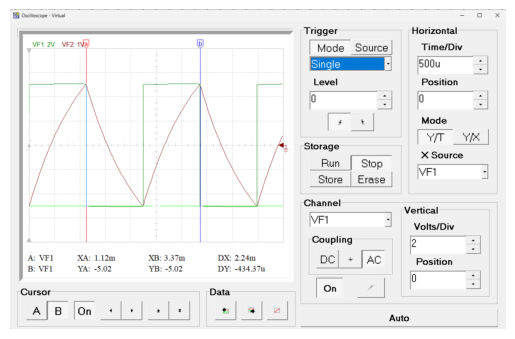

In [69]:
cols = 1
rows = 1
pdfList = ['Media/MultivibOsc.png']
display_pdfs_side_by_side(rows, cols, pdfList)

Misurando la forma d onda prodotta dal circuito si ottiene un segnale con un andamento che rispetta le aspettative, e con un periodo $T = X_B - X_A = 3.37ms - 1.12ms = 2.25ms$, ed una frequenza $f = \frac{1}{T} = 444Hz$, compatibili con quanto previsto.